<a href="https://colab.research.google.com/github/w15d0177/AIFFEL_quest_cr/blob/main/Exploration/Quest06/diffusers_node_practice.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **모델 준비하기**

In [1]:
!pip install --upgrade -qq git+https://github.com/huggingface/diffusers.git transformers accelerate

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.5/43.5 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.1/10.1 MB 80.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 336.3/336.3 kB 29.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 80.2 MB/s eta 0:00:00


# **✅ Text-to-Image Generation**

### **Text-to-Image Generation 파이프라인 불러오기**

In [2]:
'''
import torch
from diffusers import DiffusionPipeline, DPMSolverMultistepScheduler

device = "cuda"

# 파이프라인 불러오기
repo_id = "stabilityai/stable-diffusion-2-base"
pipe = DiffusionPipeline.from_pretrained(repo_id, torch_dtype=torch.float16)

pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
pipe = pipe.to(device)
'''

import torch
from diffusers import DiffusionPipeline, DPMSolverMultistepScheduler

# If you don't have a GPU or want to use the CPU instead, change the device to "cpu"
device = "cuda"

# Check if CUDA is available and set the device accordingly
if torch.cuda.is_available():
    device = "cuda"
else:
    device = "cpu"
    print("CUDA is not available. Using CPU instead.")


# 파이프라인 불러오기
repo_id = "stabilityai/stable-diffusion-2-base"
pipe = DiffusionPipeline.from_pretrained(repo_id, torch_dtype=torch.float16)

pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
pipe = pipe.to(device)

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/537 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/738 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.01k [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/929 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/716 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

### **하나의 이미지 생성하기**

In [13]:
prompt = str(input('prompt: '))  # 프롬프트를 영어로 입력해보세요

prompt: Voyager 1 spacecraft, gliding silently in deep interstellar space, surrounded by infinite stars and glowing nebulas, vast dark cosmos, faint galactic dust, subtle ambient light from distant stars, soft highlights reflecting off metallic body, cinematic, awe-inspiring, digital painting, photorealistic rendering, black background with glowing white, blue, and gold accents, ultra-HD 8K resolution, masterpiece, intricate textures, realistic lighting, majestic, ethereal, trending on ArtStation, unreal engine, stunning visuals, breathtaking details.


The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['masterpiece , intricate textures , realistic lighting , majestic , ethereal , trending on artstation , unreal engine , stunning visuals , breathtaking details .']


  0%|          | 0/25 [00:00<?, ?it/s]

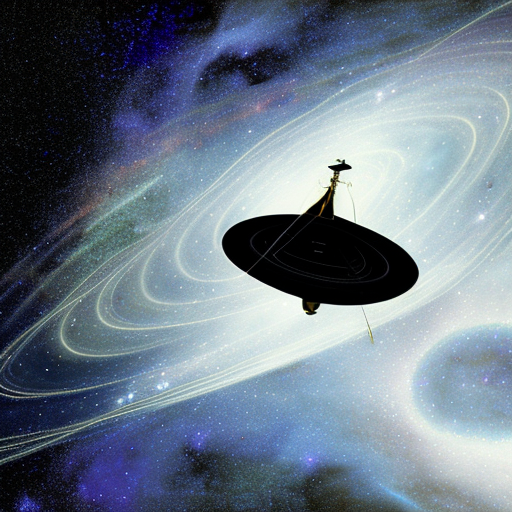

In [15]:
# 이미지 저장 폴더 만들기
import os
# os.mkdir("/content/drive/MyDrive/AIFFEL_2024/diffusers")    # diffusers 폴더를 이미 만들었다면 주석 처리해 주세요.

# 입력한 프롬프트를 사용하여 이미지 생성
image = pipe(prompt, num_inference_steps=25).images[0]

# 이미지 저장
image.save("/content/drive/MyDrive/AIFFEL_2024/diffusers/image.png")

# 이미지 출력
image

- height, width: 생성될 이미지의 가로와 세로 픽셀 크기를 조절할 수 있습니다. 8의 배수로 설정해 주세요.
- num_inference_steps: denoising 스텝 수로, 값이 커질수록 고해상도 이미지가 출력되지만 출력되는 시간이 오래 걸립니다. default 값은 50입니다.
- guidance_scale: 얼마나 주어진 프롬프트에 근접한 이미지를 생성할지를 설정하는 하이퍼파라미터로, 값이 커질수록 문자열에 근접한 이미지가 생성되지만 이미지 품질이 떨어질 수 있습니다. default는 7.5입니다.


In [16]:
import os
from PIL import Image

# 이미지 저장 폴더 생성
save_dir = "/content/drive/MyDrive/AIFFEL_2024/diffusers"
os.makedirs(save_dir, exist_ok=True)

# 하이퍼파라미터 설정
prompt = "Voyager 1 spacecraft, gliding silently in deep interstellar space, surrounded by infinite stars and glowing nebulas, vast dark cosmos, faint galactic dust, subtle ambient light from distant stars, soft highlights reflecting off metallic body, cinematic, awe-inspiring, digital painting, photorealistic rendering, black background with glowing white, blue, and gold accents, ultra-HD 8K resolution, masterpiece, intricate textures, realistic lighting, majestic, ethereal, trending on ArtStation, unreal engine, stunning visuals, breathtaking details."  # 원하는 프롬프트 입력
num_inference_steps = 50  # 샘플링 스텝
guidance_scale = 7.5  # 텍스트-이미지 조정 정도

# 이미지 생성
image = pipe(prompt, num_inference_steps=num_inference_steps, guidance_scale=guidance_scale).images[0]

# 이미지 저장
filename = "image_single.png"
save_path = os.path.join(save_dir, filename)
image.save(save_path)

# 이미지 출력
image.show()

print(f"Saved image: {save_path}")


The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['masterpiece , intricate textures , realistic lighting , majestic , ethereal , trending on artstation , unreal engine , stunning visuals , breathtaking details .']


  0%|          | 0/50 [00:00<?, ?it/s]

Saved image: /content/drive/MyDrive/AIFFEL_2024/diffusers/image_single.png


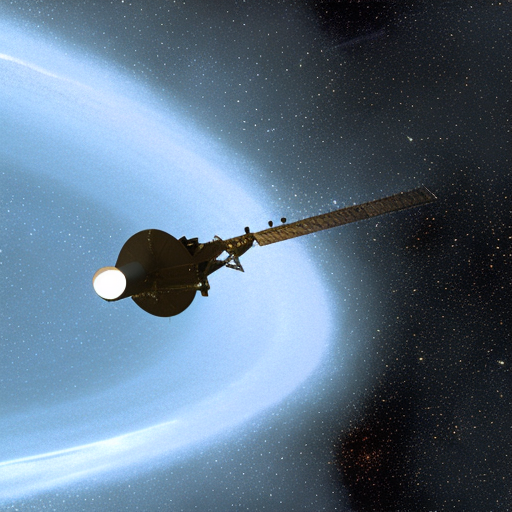

In [17]:
from IPython.display import display

display(image)

### **여러 개의 이미지 생성하기**

In [18]:
# 파이썬 이미지 처리 라이브러리 pillow 불러오기
from PIL import Image

# 틀 만들기
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows * cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols * w, rows * h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box = (i%cols * w, i // cols * h))
    return grid

  0%|          | 0/50 [00:00<?, ?it/s]

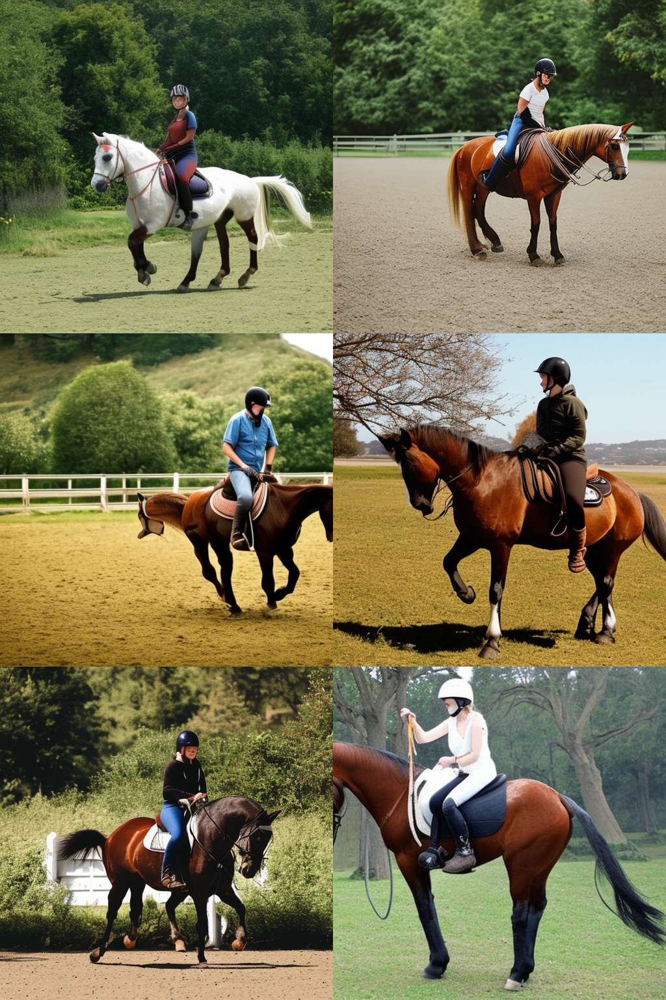

In [19]:
# 이미지의 개수
num_images = 6

# 프롬프트 입력
prompt = ['a horse riding a person'] * num_images

# 이미지 생성
images = pipe(prompt).images

# 이미지 출력
grid = image_grid(images, rows= 3, cols= 2)
grid

  0%|          | 0/50 [00:00<?, ?it/s]

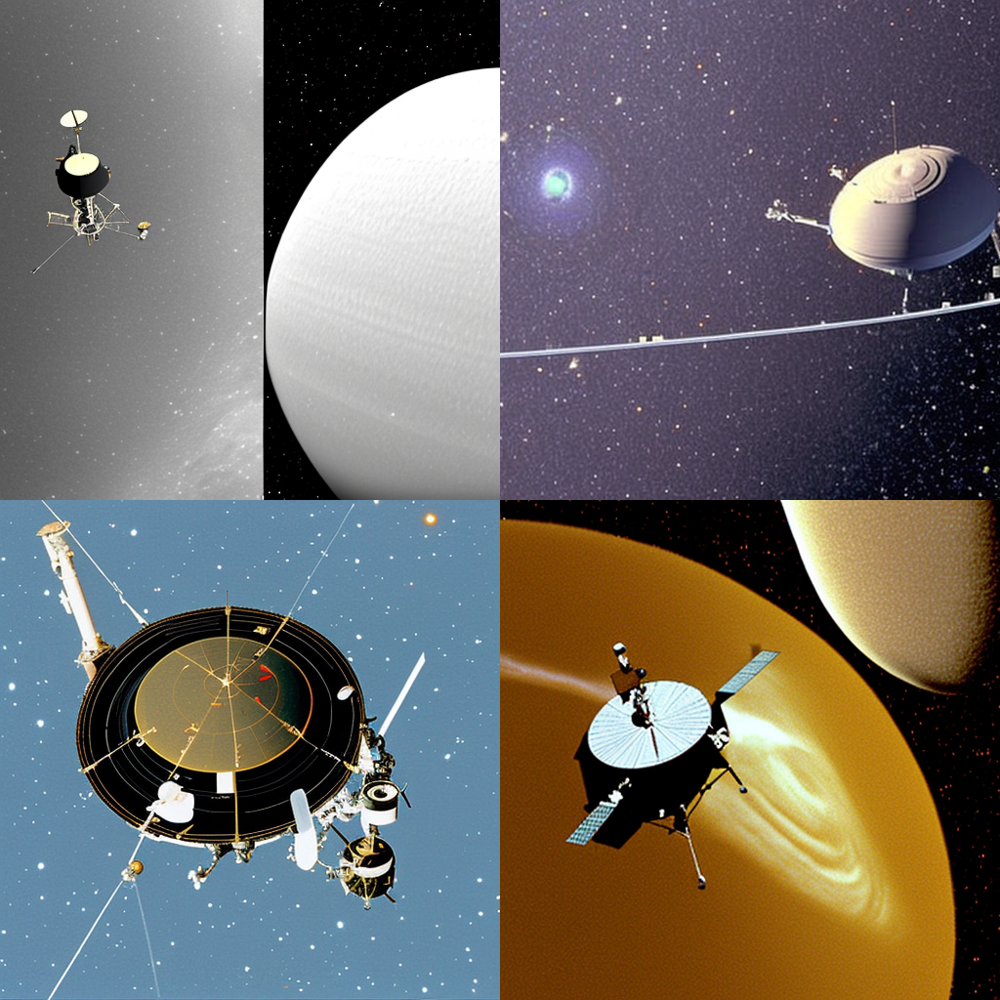

In [20]:
# 이미지의 개수
num_images = 4

# 프롬프트 입력
prompt = ['Voyager 1 spacecraft floating away into the deep space '] * num_images

# 이미지 생성
images = pipe(prompt).images

# 이미지 출력
grid = image_grid(images, rows= 2, cols= 2)
grid

In [ ]:
# GPU 메모리를 지우는 코드입니다.
# torch.cuda.empty_cache()

# **✅ Image-to-Image Generation**

In [21]:
# Image-to-Image Generation 파이프라인 불러오기
from diffusers import StableDiffusionImg2ImgPipeline

device = "cuda"
model_path = "CompVis/stable-diffusion-v1-4"

pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    model_path,
    torch_dtype=torch.float16,
)
pipe = pipe.to(device)

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

(…)kpoints/scheduler_config-checkpoint.json:   0%|          | 0.00/209 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/551 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

### **하나의 이미지 생성하기**

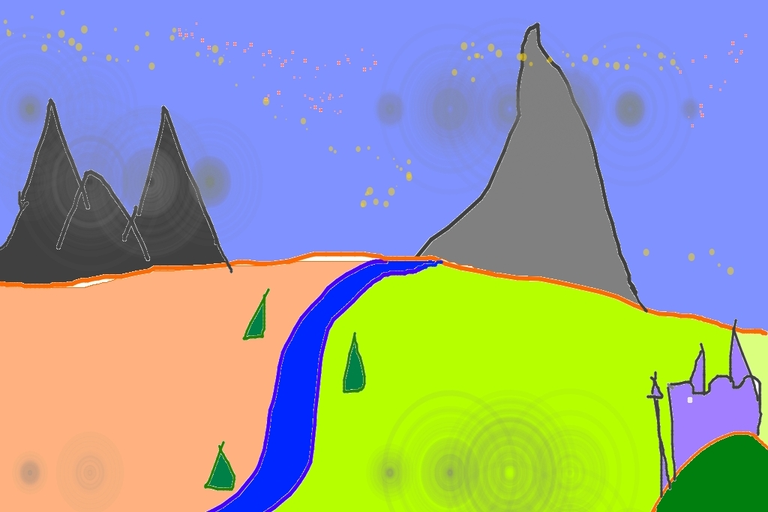

In [46]:
import requests
from io import BytesIO

url = "https://raw.githubusercontent.com/CompVis/stable-diffusion/main/assets/stable-samples/img2img/sketch-mountains-input.jpg"

# url 호출하기
response = requests.get(url)

# 이미지 열기
init_img = Image.open(BytesIO(response.content)).convert("RGB")  # 이미지를 메모리로 읽어와서 RGB로 변경합니다.
init_img = init_img.resize((768, 512))  # 이미지의 크기를 조절합니다.
init_img

In [47]:
prompt = "A fantasy landscape, trending on artstation"

- seed: 동일한 입력 문장과 각종 설정을 넣었을 때 동일한 시드 값을 주면 같은 이미지를 생성할 수 있습니다.
- strength: 레퍼런스 이미지에서 얼마나 변형할지를 설정하는 하이퍼파라미터로, 값이 커질수록 원본 이미지와 다른 이미지를 생성합니다. 0과 1 사이의 값을 선택할 수 있으며, default는 0.8입니다.
- guidance_scale: 얼마나 주어진 프롬프트에 근접한 이미지를 생성할지를 설정하는 하이퍼파라미터로, 값이 커질수록 문자열에 근접한 이미지가 생성되지만 이미지 품질이 떨어질 수 있습니다. default는 7.5입니다.
- num_inference_steps: denoising 스텝 수로, 값이 커질수록 고해상도 이미지가 출력되지만 출력되는 시간이 오래 걸립니다.

  0%|          | 0/37 [00:00<?, ?it/s]

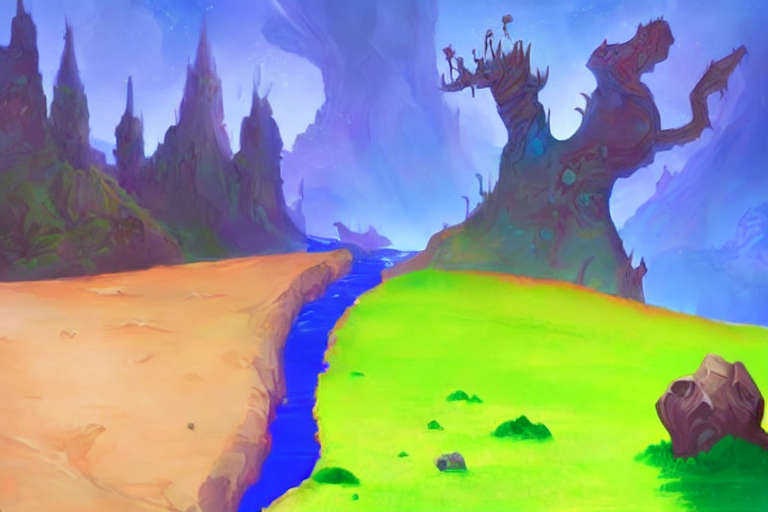

In [48]:
generator = torch.Generator(device=device).manual_seed(1024)   # 모델을 사용할 때마다 동일한 이미지를 생성하기 위해 seed를 설정합니다.

images = pipe(prompt=prompt, image=init_img, strength=0.75, guidance_scale=7.5).images
images[0].save("/content/drive/MyDrive/AIFFEL_2024/diffusers/fantasy_landscape.png")
images[0]

### **여러 개의 이미지 생성하기**

  0%|          | 0/45 [00:00<?, ?it/s]

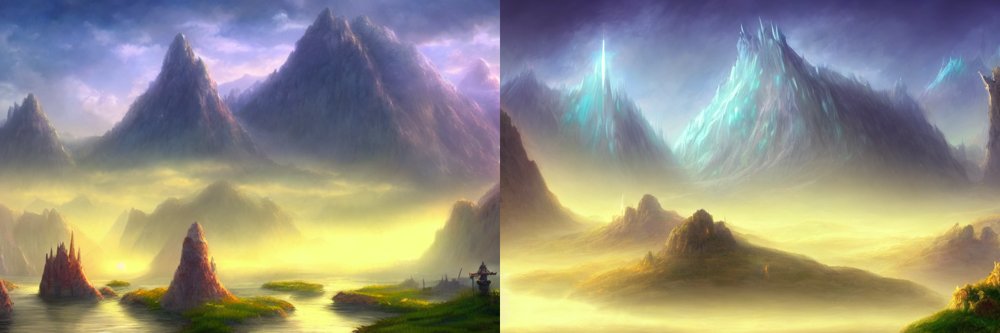

In [49]:
num_images = 2

# 프롬프트 입력
prompt = ['A fantasy landscape, trending on artstation'] * num_images

# 이미지 생성
generator = torch.Generator(device=device).manual_seed(1024)
images = pipe(prompt=prompt, image=init_img, strength=0.9, guidance_scale=13.5, num_inference_steps=50, generator=generator).images
images

# 이미지 출력
grid = image_grid(images, rows=1, cols=2)
grid

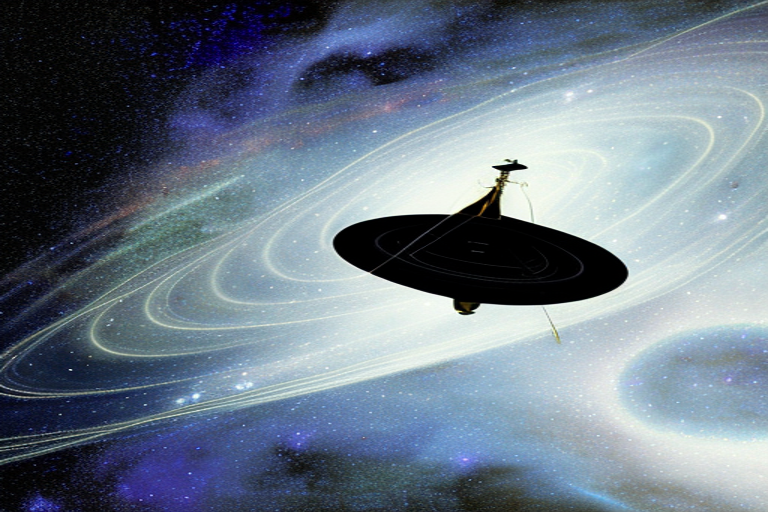

In [56]:
init_img_voyager_1 = Image.open("/content/drive/MyDrive/AIFFEL_2024/diffusers/image.png", mode = 'r')
init_img_voyager_1 = init_img_voyager_1.resize((768, 512))
init_img_voyager_1

In [67]:
prompt = "A fantasy space"

  0%|          | 0/37 [00:00<?, ?it/s]

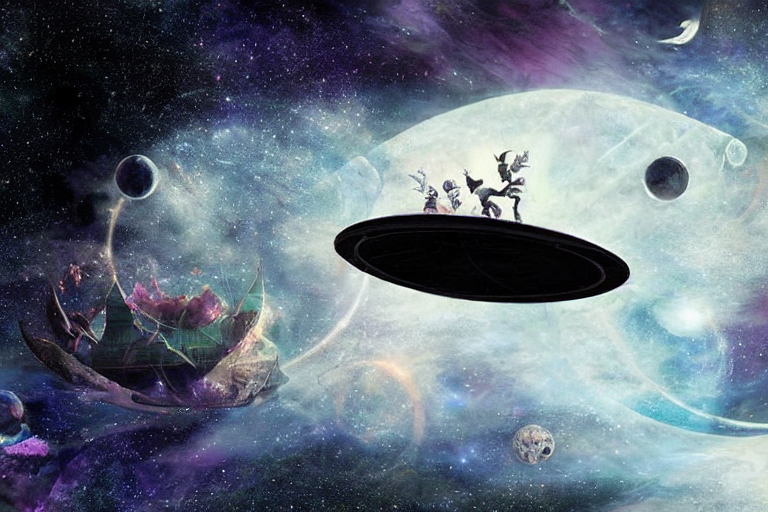

In [68]:
generator = torch.Generator(device=device).manual_seed(1024)   # 모델을 사용할 때마다 동일한 이미지를 생성하기 위해 seed를 설정합니다.

images_voyager_1 = pipe(prompt=prompt, image=init_img_voyager_1, strength=0.75, guidance_scale=7.5).images
images_voyager_1[0].save("/content/drive/MyDrive/AIFFEL_2024/diffusers/fantasy_voyager_1.png")
images_voyager_1[0]

  0%|          | 0/45 [00:00<?, ?it/s]

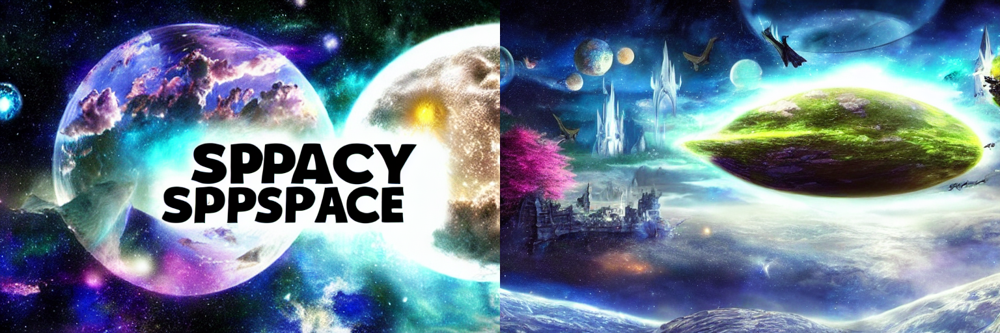

In [69]:
num_images = 2

# 프롬프트 입력
prompt = ['A fantasy space'] * num_images

# 이미지 생성
generator = torch.Generator(device=device).manual_seed(1024)
images_voyager_1 = pipe(prompt=prompt, image=init_img_voyager_1, strength=0.9, guidance_scale=13.5, num_inference_steps=50, generator=generator).images
images_voyager_1

# 이미지 출력
grid = image_grid(images_voyager_1, rows=1, cols=2)
grid